In [1]:
using LinearAlgebra, Plots, StatsPlots
using Distributions, Random, Statistics
using LaTeXStrings,CSV, DataFrames

**Discrete Random Walk**

Let $X_0$ be an initial position and $\{P_n\}$ be sequence of iid random variables. Then we can define a random walk by:
		$$X_n = X_{n-1}+P_n \  \  \  \  n\geq 1 $$

In [2]:
function random_walk(num,ti,step) 
    n=num
    dt=step
    time=dt:dt:ti

    P=zeros(length(time)+1,n)
    for (i,k) in enumerate(time)
        for j =1:n
            P[i+1, j]  = P[i,j] + rand([-1,1])
        end
        P[i+1,: ] = sort(P[i+1,:])
    end
    P
end

random_walk (generic function with 1 method)

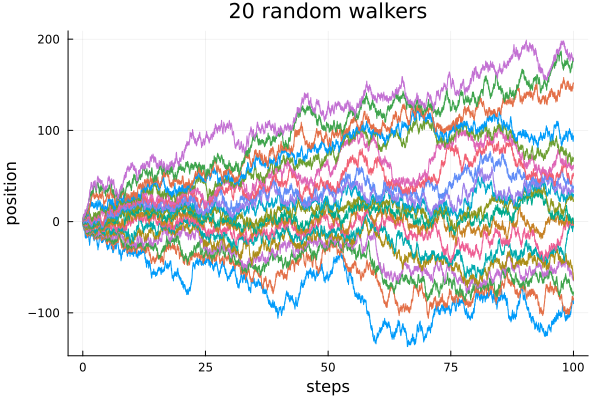

In [10]:
n=20
plot()
steps=100
dt=1/100
A=random_walk(n,steps,dt) 
for i=1:n
    plot!(0:dt:steps, A[:,i], label="")
end
display(plot!(title="20 random walkers", xlabel="steps", ylabel="position"))

We can see that the position of each random walkers is independent of each other. Their paths intersect often at the same time. 

**Symmetric Brownian Motion**

A  matrix process $S_t$ of symmetric matrices, whose entries are the independent	Brownian motions is called a Symmetric Brownian Motion/Dyson Brownian Motion (DBM)
		$$S_{t}^{ij} =\begin{cases}
			\frac{1}{\sqrt{d}} B_{t}^{ij} & i\neq j\\
			\sqrt{\frac{2}{d}} \ B_{t}^{ij} & i=j
		\end{cases}$$

We will analyse the evolution of eigenvalues of $S_t$ with time $t$

In [11]:
function symm_Brow(n,t)
    dt=1/10000
    B=zeros(n,n)
    S=zeros(n,n)
    Tot_E=zeros(length(0:dt:t), n)
    r=2
    for time = dt:dt:t
        for i in 1:n
            for j in 1:i
                B[i,j]=B[i,j]+sqrt(dt)*randn()
                B[j,i]=B[i,j]
            end
        end
        for i in 1:n
            for j in 1:i
                if (i!=j)
                    S[i,j]=(B[i,j]/sqrt(n))
                    S[j,i]=S[i,j]
                else
                    S[i,j]= sqrt(2)*(B[i,j]/sqrt(n)) 
                end   
            end
        end
        Tot_E[r,:]=sort(eigvals(S))
        r=r+1
    end
    Tot_E
end

symm_Brow (generic function with 1 method)

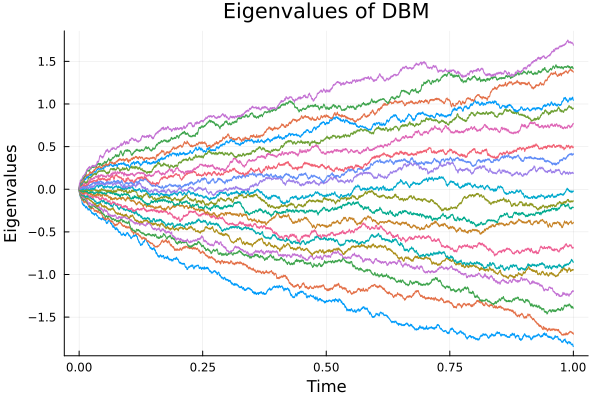

In [12]:
n=20
t=1
dt=1/10000

A=symm_Brow(n,t);
plot()
for i in 1:n
    plot!(0:dt:t, A[:,i], label="", ms=1)
end
plot!(xlabel="Time")
plot!(ylabel="Eigenvalues")
display(plot!(title="Eigenvalues of DBM"))

Here we see that initially eigenvalues are all zeroes but with time, the eigenvalues spread out. Moreover, the two eigenvalues repel each other, that is, if at one instant they come too close, at the other instant, they spread out even further. Thus, unlike the random walk, their paths never intersect. 